# Geospatial Job Management and Visualization with OpenEO

When executing algorithms across large spatial areas, it is often necessary to divide the area of interest into smaller regions and run the algorithm on each region independently. To streamline this process and manage multiple jobs simultaneously, the `MultiBackendJobManager` was developed.

In this example, we demonstrate how to process an algorithm across a grid of smaller tiles and visualize job statuses using interactive maps. Our use case involves calculating `Best Available Pixel Composites`, using an openEO Process hosted in the [APEx Algorithm Catalogue](https://algorithm-catalogue.apex.esa.int/apps/bap_composite).

We will go through the following steps:
1. **Import the required packages**
2. **Generate a Spatial Grid for the Antwerp Region**
3. **Prepare Jobs for Parallel Processing**
4. **Prepare Job visualization with a Custom Color Mapping**
5. **Run the Jobs with MultiBackendJobManager**


**NOTE**
It is important to highlight that you will need to have access to the [Copernicus Data Space Ecosytem](https://documentation.dataspace.copernicus.eu/Registration.html") in order to execute this notebook.


### 1. Import the required packages

Before we start, we install the required non-native packages needed this notebook example. 

In [1]:
import time
import copy

import geopandas as gpd
from shapely import wkt

import openeo
from openeo.extra.job_management import (
    MultiBackendJobManager,
    create_job_db,
    get_job_db,
    split_area,
)
from openeo.extra.job_management.process_based import ProcessBasedJobCreator

import folium
from IPython.display import clear_output, display


## 2. Generate a Spatial-Temporal Grid for the Antwerp Region

To manage our large-scale task efficiently, we split a larger area of interest into smaller tiles with the built-in `split_area()` helper from the openEO Python client.

`split_area()` returns a `GeoDataFrame` in the tiling projection. In this notebook, we convert the tiles to WGS 84 afterwards so the geometries can be visualized with Folium and passed cleanly to the parameterized process used by `ProcessBasedJobCreator`.


In [2]:
TILING_PROJECTION = "EPSG:32631"
AREA_OF_INTEREST = {
    "west": 590_000.0,
    "south": 5_660_000.0,
    "east": 610_000.0,
    "north": 5_680_000.0,
    "crs": TILING_PROJECTION,
}
TILE_SIZE = 5_000

grid_df = split_area(
    aoi=AREA_OF_INTEREST,
    tile_size=TILE_SIZE,
    projection=TILING_PROJECTION,
)

# Convert tiles to WGS 84 for Folium and GeoJSON-style process parameters.
grid_df = grid_df.to_crs("EPSG:4326")
grid_df["id"] = range(len(grid_df))

grid_df

,geometry,id
0,"POLYGON ((4.35633 51.08363, 4.35765 51.12858, ...",0
1,"POLYGON ((4.35765 51.12858, 4.35897 51.17353, ...",1
2,"POLYGON ((4.35897 51.17353, 4.36029 51.21848, ...",2
3,"POLYGON ((4.36029 51.21848, 4.36161 51.26343, ...",3
4,"POLYGON ((4.42769 51.08278, 4.42908 51.12773, ...",4
5,"POLYGON ((4.42908 51.12773, 4.43047 51.17268, ...",5
6,"POLYGON ((4.43047 51.17268, 4.43186 51.21762, ...",6
7,"POLYGON ((4.43186 51.21762, 4.43326 51.26257, ...",7
8,"POLYGON ((4.49905 51.08189, 4.50051 51.12683, ...",8
9,"POLYGON ((4.50051 51.12683, 4.50196 51.17178, ...",9


### Visualize the tiling grid

We use Folium to create an interactive visualization of the spatial grid. This allows us to examine the layout of tiles across the area of interest and ensure that the grid aligns correctly with our region.

In [3]:
minx, miny, maxx, maxy = grid_df.total_bounds
center_lat = (miny + maxy) / 2
center_lon = (minx + maxx) / 2

grid_map = folium.Map(location=[center_lat, center_lon], zoom_start=9, tiles="CartoDB positron")
folium.GeoJson(
    data=grid_df.__geo_interface__,
    style_function=lambda _: {"color": "#1f77b4", "weight": 1, "fillOpacity": 0.10},
    tooltip=folium.GeoJsonTooltip(fields=["id"], aliases=["Tile ID"]),
).add_to(grid_map)
grid_map.fit_bounds([[miny, minx], [maxy, maxx]])
grid_map

### 3. Prepare Jobs for Parallel Processing

In this example, we create Best Available Pixel composites for every tile. For the compositing workflow itself, we directly use the standardized implementation hosted in the [APEx Algorithm Catalogue](https://algorithm-catalogue.apex.esa.int/apps/bap_composite). The information that we need is the link to the openEO process and the openEO backend, both of which you can find in the Execution Information tab on the catalogue.

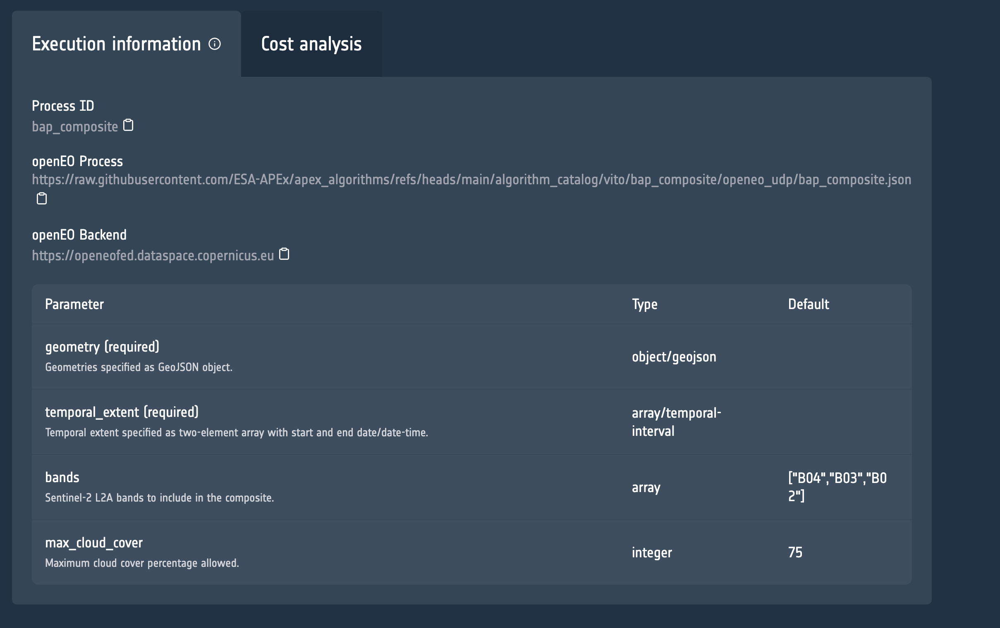
 
The jobs database is initialized from the `GeoDataFrame` returned by `split_area()` and persisted with `create_job_db()`, which adds the bookkeeping columns needed by the `MultiBackendJobManager`.
 
For more details, see the cookbook sections on [Preparing the job database](https://open-eo.github.io/openeo-python-client/cookbook/job_manager.html#preparing-the-job-database), [Job Database](https://open-eo.github.io/openeo-python-client/cookbook/job_manager.html#job-database), and [Job creation based on parameterized processes](https://open-eo.github.io/openeo-python-client/cookbook/job_manager.html#job-creation-based-on-parameterized-processes).


In [29]:
# Make use of the Best Available Pixel openEO process to obtain Sentinel-2 composites
process_graph_url = "https://github.com/ESA-APEx/apex_algorithms/raw/refs/heads/main/algorithm_catalog/vito/bap_composite/openeo_udp/bap_composite.json"
backend = "https://openeofed.dataspace.copernicus.eu"

start_job = ProcessBasedJobCreator(
    namespace=process_graph_url,
    parameter_defaults={
        "temporal_extent": ["2024-06-01", "2024-09-01"],
    },
)

# Initiate MultiBackendJobManager
job_manager = MultiBackendJobManager()
connection = openeo.connect(url=backend).authenticate_oidc()
job_manager.add_backend("cdse", connection=connection, parallel_jobs=2)

# Create the job tracker file
job_tracker = "jobs.csv"
job_db = create_job_db(job_tracker, df=grid_df, on_exists="skip")

Authenticated using refresh token.


### 4. Prepare Job visualization with a Custom Color Mapping

To effectively monitor the progress of geospatial processing tasks, we define a function to visualize job statuses on an interactive map. This visualization uses Folium, with custom color mappings for each job status, providing a clear overview of the current state of all jobs.

In [30]:
colors = {
    "not_started": "lightgrey",
    "created": "gold",
    "queued": "lightsteelblue",
    "running": "navy",
    "finished": "lime",
    "error": "darkred",
    "skipped": "darkorange",
    "start_failed": "red",
    None: "grey",  # Default color for any undefined status
}

This color scheme makes it easy to distinguish between different statuses.
The `plot_job_status` function generates an interactive map.

In [31]:
import rasterio
import numpy as np
from rasterio.warp import transform_bounds
from pyproj import Transformer
from PIL import Image
import base64
import io
from pathlib import Path

S2_RGB_GAMMA = 2.2
S2_RGB_STRETCH = {
    "red": (0.02, 0.40),
    "green": (0.02, 0.40),
    "blue": (0.02, 0.45),
}


# Define the color mapping for job statuses
def plot_job_status(status_df, color_dict):
    status_plot = copy.deepcopy(status_df)
    if len(status_plot) > 0 and isinstance(status_plot["geometry"].iloc[0], str):
        status_plot["geometry"] = status_plot["geometry"].apply(wkt.loads)
    status_plot = gpd.GeoDataFrame(status_plot, geometry="geometry", crs="EPSG:4326")

    if status_plot.empty:
        return folium.Map(location=[51.15, 4.4], zoom_start=8, tiles="CartoDB positron")

    minx, miny, maxx, maxy = status_plot.total_bounds
    center_lat = (miny + maxy) / 2
    center_lon = (minx + maxx) / 2

    status_map = folium.Map(location=[center_lat, center_lon], zoom_start=8, tiles="CartoDB positron")

    folium.GeoJson(
        data=status_plot.__geo_interface__,
        style_function=lambda feature: {
            "fillColor": color_dict.get(feature["properties"].get("status"), color_dict[None]),
            "color": "#333333",
            "weight": 1,
            "fillOpacity": 0 if feature["properties"].get("status") == "finished" else 0.6,
        },
        tooltip=folium.GeoJsonTooltip(fields=["status"], aliases=["Status"]),
    ).add_to(status_map)

    status_map.fit_bounds([[miny, minx], [maxy, maxx]])

    return status_map

def normalize(
    array: np.ndarray, min_reflectance: float, max_reflectance: float
) -> np.ndarray:
    """Apply one fixed Sentinel-2 reflectance stretch across all tiles."""
    reflectance = array.astype(np.float32) / 10_000.0
    clipped = np.clip(reflectance, min_reflectance, max_reflectance)
    normalized = (clipped - min_reflectance) / (max_reflectance - min_reflectance)
    corrected = np.power(normalized, 1 / S2_RGB_GAMMA)
    return (corrected * 255).astype(np.uint8)

def add_cog_layer(cog_url, name=None, m=None):
    """Add a Cloud-Optimized GeoTIFF layer to the folium map.
    
    Supports both single-band (grayscale) and multi-band (RGB) COGs.
    """
    with rasterio.open(cog_url) as src:
        bounds = transform_bounds(src.crs, "EPSG:4326", *src.bounds)
        num_bands = src.count
        
        # Read RGB bands
        b = normalize(src.read(1), *S2_RGB_STRETCH["blue"])
        g = normalize(src.read(2), *S2_RGB_STRETCH["green"])
        r = normalize(src.read(3), *S2_RGB_STRETCH["red"])
            
        # Stack into RGB image
        rgb_image = np.stack([r, g, b], axis=2).astype(np.uint8)
        img = Image.fromarray(rgb_image, mode='RGB')

    # Convert to PNG data URI
    buf = io.BytesIO()
    img.save(buf, format="PNG")
    data_url = "data:image/png;base64," + base64.b64encode(buf.getvalue()).decode("utf-8")

    # bounds format: (west, south, east, north)
    bbox = [[bounds[1], bounds[0]], [bounds[3], bounds[2]]]
    overlay = folium.raster_layers.ImageOverlay(
        image=data_url,
        bounds=bbox,
        name=name or "COG",
        opacity=0.8
    )
    if m:
        overlay.add_to(m)
    return overlay


def visualise_finished_jobs(output_df, status_map):
    finished_jobs = output_df[output_df["status"] == "finished"]
    for _, job in finished_jobs.iterrows():
        image_path = Path(f"job_{job['id']}/openEO_2024-06-01Z.tif")
        if not image_path.exists():
            print(f"{image_path} does not exist for {job['id']}")
            continue
        add_cog_layer(image_path, f"Result {job['id']}", status_map)
    
    

### 5. Running the Jobs with MultiBackendJobManager

Finally, we run the jobs using MultiBackendJobManager, which allows us to manage multiple job executions across. As a standard-user, you can run 2 parallel jobs at any time.

Threading is applied to enable the visualization of job statuses while concurrently running openEO jobs. This approach allows the jobs to execute in parallel with the status updates, ensuring that the map is refreshed regularly without blocking job execution. In total there are two threads:

- Job Execution: The jobs are initiated using the job manager that runs in its own thread. This allows the jobs to be executed asynchronously.
- Visualization: At the same time, we reopen the persisted job database and update the visualization from the current tracked statuses.

For the public thread lifecycle and stop behavior, see [Running in a Background Thread](https://open-eo.github.io/openeo-python-client/cookbook/job_manager.html#running-in-a-background-thread) and [Job Status Tracking](https://open-eo.github.io/openeo-python-client/cookbook/job_manager.html#job-status-tracking).



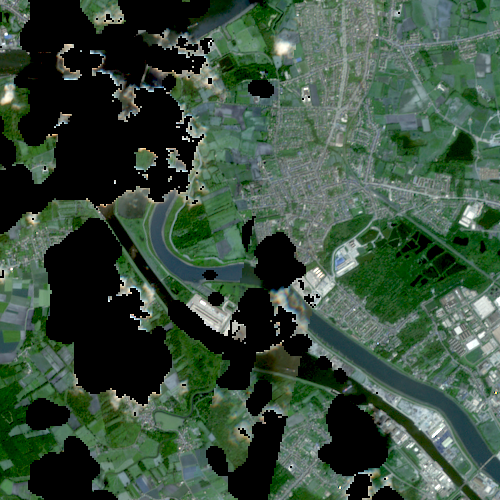
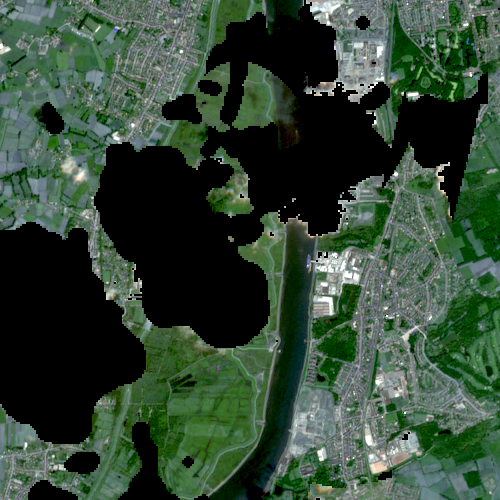
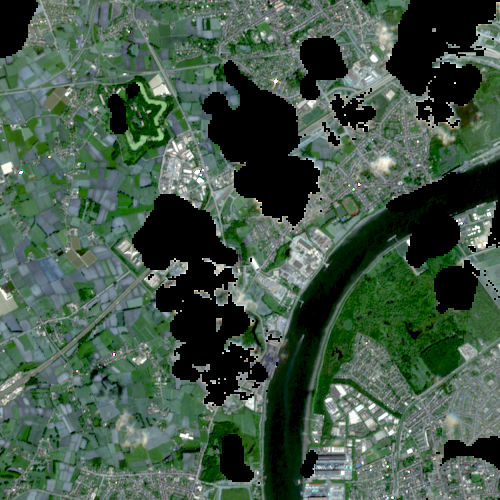
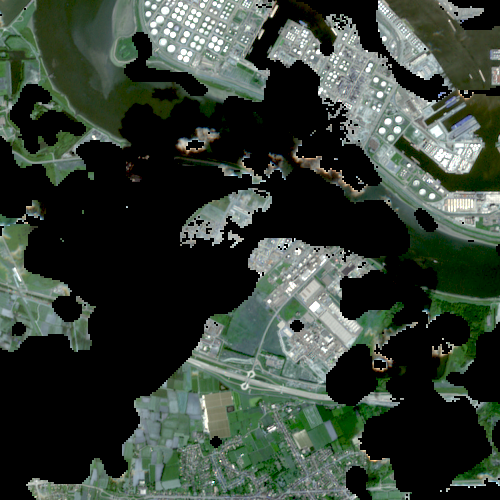
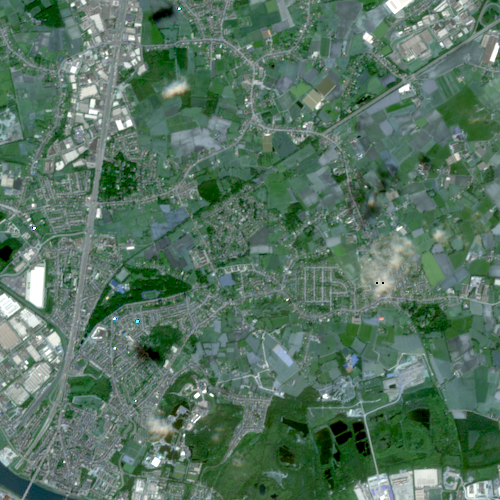
...
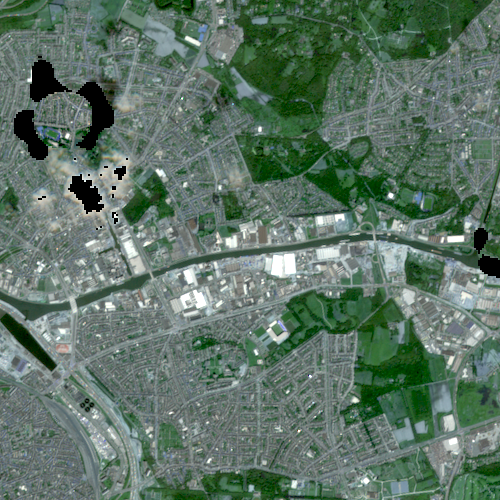
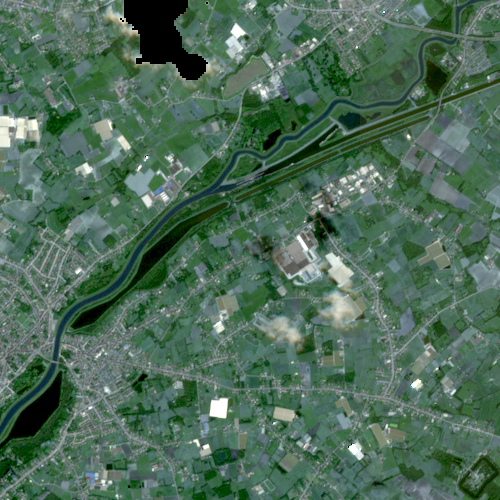
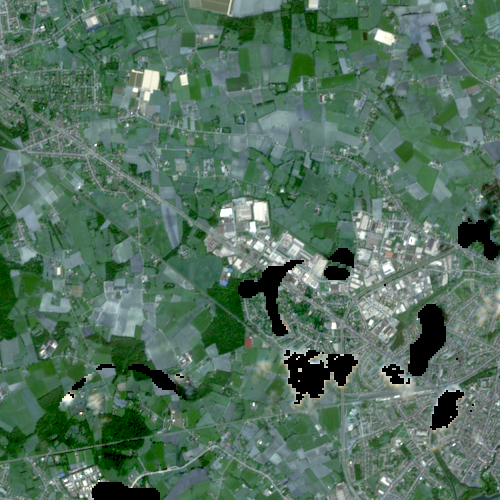
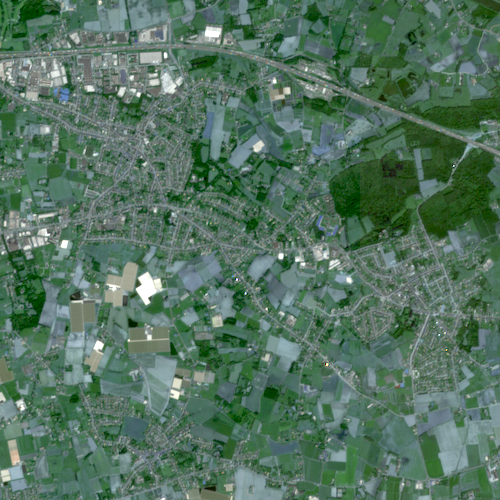
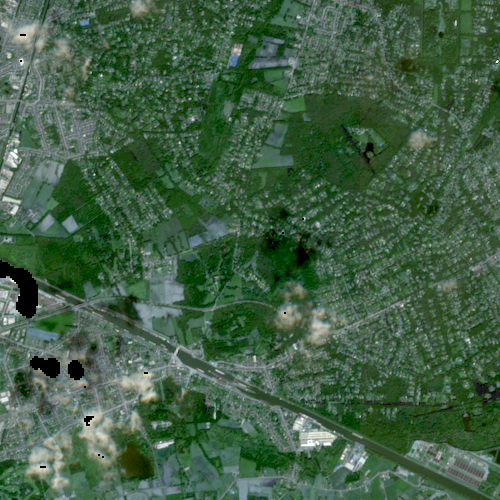

In [33]:
# Start a threaded job manager
job_manager.start_job_thread(start_job=start_job, job_db=job_db)

tracked_statuses = [
    "not_started",
    "queued_for_start",
    "created",
    "queued",
    "running",
    "finished",
    "error",
    "canceled",
    "skipped",
    "start_failed",
]
active_statuses = {"not_started", "queued_for_start", "created", "queued", "running"}


try:
    while True:
        status_df = get_job_db(job_tracker).get_by_status(statuses=tracked_statuses)
        status_map = plot_job_status(status_df=status_df, color_dict=colors)
        clear_output(wait=True)
        visualise_finished_jobs(status_df, status_map)
        display(status_map)

        

        # Stop once no jobs are left in an active state.
        if status_df["status"].isin(active_statuses).sum() == 0:
            job_manager.stop_job_thread()
            break

        time.sleep(60)  # Wait before the next update

except KeyboardInterrupt:
    job_manager.stop_job_thread()